<a href="https://colab.research.google.com/github/rohit-LIGO/McGill/blob/svn---rohit-LIGO-rohit_nair17004-ls-https%2Fanag-repo.lbl.gov%2Fsvn%2Ftestrepo/higgs.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import time, psutil, os

# Mathematical functions
import math

# Data manipulation
import numpy as np
import pandas as pd

# Plotting and visualization
import matplotlib.pyplot as plt
%matplotlib inline
import matplotlib.patches as mpatches

from mpl_toolkits.mplot3d import Axes3D
from matplotlib.colors import ListedColormap
from matplotlib import cm
from mpl_toolkits.mplot3d.axes3d import get_test_data

import seaborn as sns
sns.set_theme()
import plotly.graph_objects as go
from plotly.subplots import make_subplots

import sklearn

In [ ]:
start = time.time()
process = psutil.Process(os.getpid())

In [ ]:
higgs = pd.read_csv("higgs.csv.gz")
higgs.head()

,EventId,DER_mass_MMC,DER_mass_transverse_met_lep,DER_mass_vis,DER_pt_h,DER_deltaeta_jet_jet,DER_mass_jet_jet,DER_prodeta_jet_jet,DER_deltar_tau_lep,DER_pt_tot,...,PRI_jet_leading_eta,PRI_jet_leading_phi,PRI_jet_subleading_pt,PRI_jet_subleading_eta,PRI_jet_subleading_phi,PRI_jet_all_pt,Weight,Label,KaggleSet,KaggleWeight
0,100000,138.470,51.655,97.827,27.980,0.91,124.711,2.666,3.064,41.928,...,2.150,0.444,46.062,1.24,-2.475,113.497,0.000814,s,t,0.002653
1,100001,160.937,68.768,103.235,48.146,-999.00,-999.000,-999.000,3.473,2.078,...,0.725,1.158,-999.000,-999.00,-999.000,46.226,0.681042,b,t,2.233584
2,100002,-999.000,162.172,125.953,35.635,-999.00,-999.000,-999.000,3.148,9.336,...,2.053,-2.028,-999.000,-999.00,-999.000,44.251,0.715742,b,t,2.347389
3,100003,143.905,81.417,80.943,0.414,-999.00,-999.000,-999.000,3.310,0.414,...,-999.000,-999.000,-999.000,-999.00,-999.000,-0.000,1.660654,b,t,5.446378
4,100004,175.864,16.915,134.805,16.405,-999.00,-999.000,-999.000,3.891,16.405,...,-999.000,-999.000,-999.000,-999.00,-999.000,0.000,1.904263,b,t,6.245333


In [ ]:
from sklearn.model_selection import train_test_split
train, test = train_test_split(higgs, test_size=0.2) 

In [ ]:
def bar_donut(higgs, col, h = 500, w = 800):
    fig = make_subplots(rows = 1, cols = 2, specs = [[{'type': 'xy'}, {'type': 'domain'}]])
    x_val, y_val = higgs[col].value_counts(sort = False).index.tolist(), higgs[col].value_counts(sort = False).tolist()
    fig.add_trace(go.Bar(x = x_val, y = y_val, text = y_val, textposition = 'auto'), row = 1, col = 1)
    fig.add_trace(go.Pie(values = y_val, labels = x_val, hole = 0.5, textinfo = 'label+percent', title = f"{col}"), row = 1, col = 2)
    fig.update_layout(height = h, width = w, showlegend = False, xaxis = dict(tickmode = 'linear', tick0 = 0, dtick = 1), title = dict(text = f"Frequency distribution of {col}", x = 0.5, y = 0.95)) 
    fig.show()

In [ ]:
bar_donut(train, 'Label')

In [ ]:
train_b = train[train['Label'] == 'b'] 
train_s = train[train['Label'] == 's']

In [ ]:
higgs_unique = pd.DataFrame()
higgs_unique['Training set (background events)'] = [train_b[col].nunique() for col in test.columns]
higgs_unique['Training set (signal events)'] = [train_s[col].nunique() for col in test.columns]
higgs_unique['Training set (all events)'] = [train[col].nunique() for col in test.columns]
higgs_unique['Test set (all events)'] = [test[col].nunique() for col in test.columns]
higgs_unique.set_index(test.columns, inplace = True)
higgs_unique.style.set_caption("Number of unique values for the predictor variables")

,Training set (background events),Training set (signal events),Training set (all events),Test set (all events)
EventId,430757,223833,654590,163648
DER_mass_MMC,148574,80691,163410,85698
DER_mass_transverse_met_lep,121725,79088,127106,85791
DER_mass_vis,137545,70750,143367,82790
DER_pt_h,134982,124610,176480,90949
DER_deltaeta_jet_jet,6254,7561,7589,6790
DER_mass_jet_jet,93770,81191,164053,45586
DER_prodeta_jet_jet,15581,18572,21004,14496
DER_deltar_tau_lep,4962,3644,4963,4541
DER_pt_tot,71080,56147,79719,50068


In [ ]:
def minus_999(df):
    index = [col for col in df.columns if -999 in higgs[col].value_counts().index]
    data = [higgs[col].value_counts()[-999]/len(higgs) for col in index]
    return pd.Series(index = index, data = data).sort_values(ascending = False)

higgs_minus_999 = pd.DataFrame()
higgs_minus_999['Training set (background events)'] = minus_999(train_b).values
higgs_minus_999['Training set (signal events)'] = minus_999(train_s).values
higgs_minus_999['Training set (all events)'] = minus_999(train).values
higgs_minus_999['Test set (all events)'] = minus_999(test).values
higgs_minus_999.set_index(minus_999(train).index, inplace = True)
higgs_minus_999.style.set_caption("Proportion of the value -999 in the dataset columns which contain -999")

,Training set (background events),Training set (signal events),Training set (all events),Test set (all events)
DER_deltaeta_jet_jet,0.709149,0.709149,0.709149,0.709149
DER_mass_jet_jet,0.709149,0.709149,0.709149,0.709149
DER_prodeta_jet_jet,0.709149,0.709149,0.709149,0.709149
DER_lep_eta_centrality,0.709149,0.709149,0.709149,0.709149
PRI_jet_subleading_pt,0.709149,0.709149,0.709149,0.709149
PRI_jet_subleading_eta,0.709149,0.709149,0.709149,0.709149
PRI_jet_subleading_phi,0.709149,0.709149,0.709149,0.709149
PRI_jet_leading_pt,0.400093,0.400093,0.400093,0.400093
PRI_jet_leading_eta,0.400093,0.400093,0.400093,0.400093
PRI_jet_leading_phi,0.400093,0.400093,0.400093,0.400093


In [ ]:
train_temp = train.copy(deep = True)
train_temp['dataset'] = "Train"
test_temp = test.copy(deep = True)
test_temp['dataset'] = "Test"
data = pd.concat([train_temp, test_temp], axis = 0, ignore_index = True)

In [ ]:
def hist(higgs, cols, bins, ncols = 3):
    nrows = math.ceil(len(cols) / ncols)
    fig, ax = plt.subplots(nrows, ncols, figsize = (5 * ncols, 4.2 * nrows), sharey = False)
    for i in range(len(cols)):
        sns.histplot(data = higgs, x = cols[i], bins = bins, hue = 'dataset', palette = ['red', 'grey'], ax = ax[i // ncols, i % ncols])
        ax[i // ncols, i % ncols].set_xlabel(cols[i])
        if i % ncols != 0:
            ax[i // ncols, i % ncols].set_ylabel(" ")
    plt.tight_layout()
    plt.show()

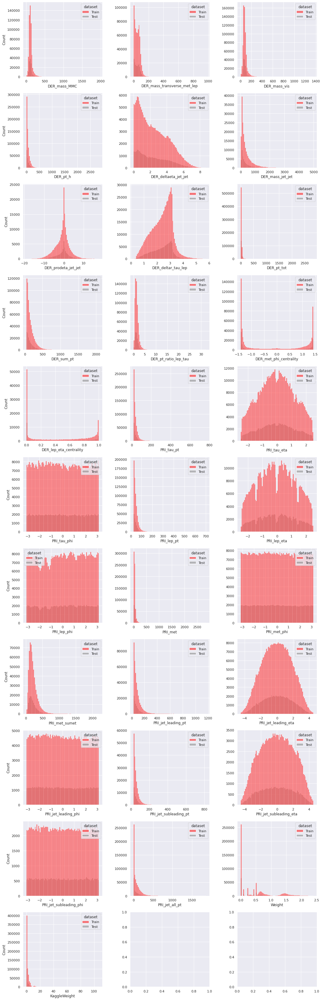

In [ ]:
hist(data.replace(-999, np.nan),
     list(test.columns[test.dtypes == 'float64']),
     bins = max(math.floor(len(train)**(1/3)), math.floor(len(test)**(1/3))),
     ncols = 3)

In [ ]:
def hist(higgs, cols, target, bins, ncols = 3):
    nrows = math.ceil(len(cols) / ncols)
    fig, ax = plt.subplots(nrows, ncols, figsize = (5 * ncols, 4.2 * nrows), sharey = False)
    for i in range(len(cols)):
        sns.histplot(data = higgs, x = cols[i], bins = bins, hue = target, palette = ['red', 'grey'], ax = ax[i // ncols, i % ncols])
        ax[i // ncols, i % ncols].set_xlabel(cols[i])
        if i % ncols != 0:
            ax[i // ncols, i % ncols].set_ylabel(" ")
    plt.tight_layout()
    plt.show()

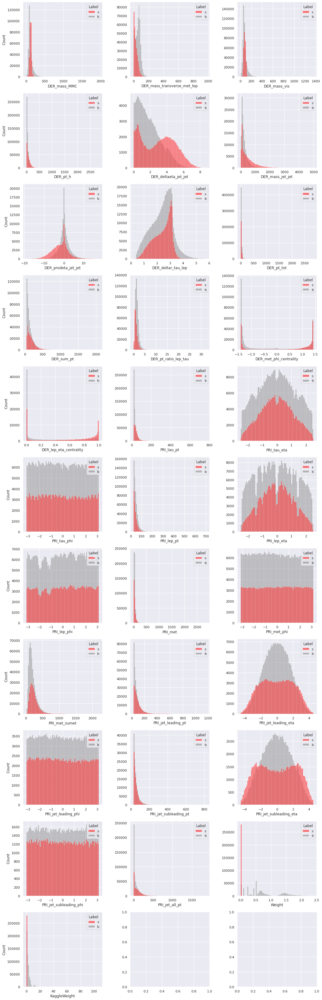

In [ ]:
hist(data.replace(-999, np.nan),
     list(test.columns[test.dtypes == 'float64']), target='Label',
     bins = max(math.floor(len(train)**(1/3)), math.floor(len(test)**(1/3))),
     ncols = 3)

In [ ]:
higgs_skew = pd.DataFrame()
cols_float_test = test.columns[test.dtypes == 'float64']
skew_train_b = train_b.replace(-999, np.nan)[cols_float_test].skew().values
skew_train_s = train_s.replace(-999, np.nan)[cols_float_test].skew().values
skew_train = train.replace(-999, np.nan)[cols_float_test].skew().values
skew_test = test.replace(-999, np.nan)[cols_float_test].skew().values
higgs_skew['Training set (background events)'], higgs_skew['Training set (signal events)'] = skew_train_b, skew_train_s
higgs_skew['Training set (all events)'], higgs_skew['Test set (all events)'] = skew_train, skew_test
higgs_skew.set_index(np.array(cols_float_test), inplace = True)
higgs_skew.style.set_caption("Skewness of the float features")

,Training set (background events),Training set (signal events),Training set (all events),Test set (all events)
DER_mass_MMC,3.215700,5.068341,3.767446,4.001934
DER_mass_transverse_met_lep,0.999183,2.958274,1.326687,1.177243
DER_mass_vis,3.151448,3.632623,3.550889,4.172048
DER_pt_h,2.466565,2.122024,2.384770,2.240637
DER_deltaeta_jet_jet,0.793338,0.109434,0.580830,0.575279
DER_mass_jet_jet,2.726774,1.794706,2.473231,2.337164
DER_prodeta_jet_jet,0.195933,-0.152844,-0.341759,-0.307428
DER_deltar_tau_lep,-0.123874,-0.521290,-0.223596,-0.224798
DER_pt_tot,2.670268,11.402143,5.877695,2.999258
DER_sum_pt,2.687508,1.977630,2.361549,2.341169


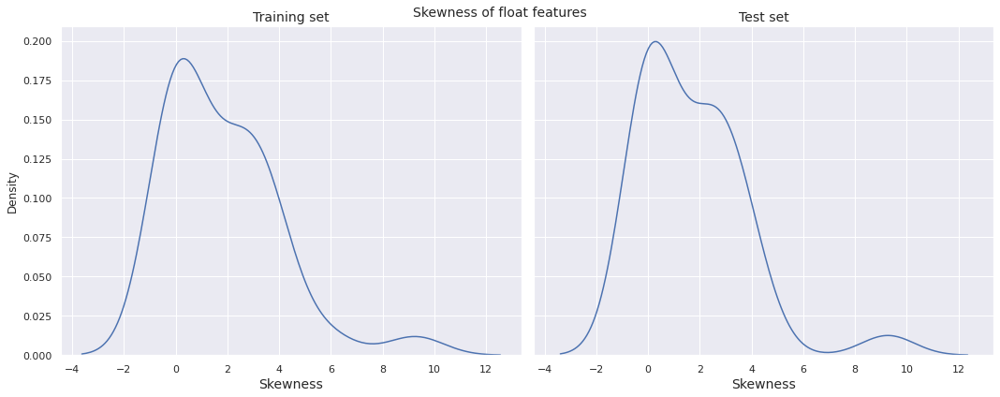

In [ ]:
fig, ax = plt.subplots(1, 2, figsize = (15, 6), sharex = True, sharey = True)
sns.kdeplot(data = higgs_skew, x = 'Training set (all events)', ax = ax[0])
sns.kdeplot(data = higgs_skew, x = 'Test set (all events)', ax = ax[1])
ax[0].set_title("Training set", fontsize = 14)
ax[0].set_xlabel("Skewness", fontsize = 14)
ax[1].set_title("Test set", fontsize = 14)
ax[1].set_xlabel("Skewness", fontsize = 14)
plt.suptitle("Skewness of float features", fontsize = 14)
plt.tight_layout()
plt.show()

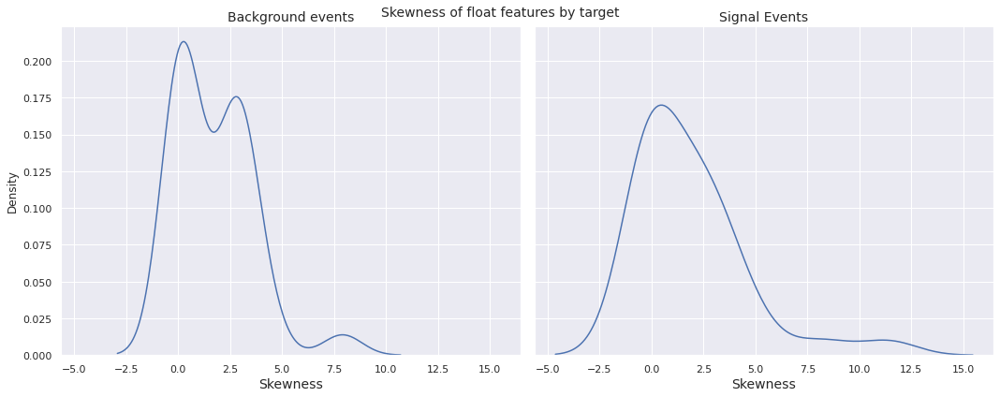

In [ ]:
fig, ax = plt.subplots(1, 2, figsize = (15, 6), sharex = True, sharey = True)
sns.kdeplot(data = higgs_skew, x = 'Training set (background events)', ax = ax[0])
sns.kdeplot(data = higgs_skew, x = 'Training set (signal events)', ax = ax[1])
ax[0].set_title("Background events", fontsize = 14)
ax[0].set_xlabel("Skewness", fontsize = 14)
ax[1].set_title("Signal Events", fontsize = 14)
ax[1].set_xlabel("Skewness", fontsize = 14)
plt.suptitle("Skewness of float features by target", fontsize = 14)
plt.tight_layout()
plt.show()


In [ ]:
higgs_kurt = pd.DataFrame()
cols_float_test = test.columns[test.dtypes == 'float64']
kurt_train_b = train_b.replace(-999, np.nan)[cols_float_test].kurt().values
kurt_train_s = train_s.replace(-999, np.nan)[cols_float_test].kurt().values
kurt_train = train.replace(-999, np.nan)[cols_float_test].kurt().values
kurt_test = test.replace(-999, np.nan)[cols_float_test].kurt().values
higgs_kurt['Training set (background events)'], higgs_kurt['Training set (signal events)'] = kurt_train_b, kurt_train_s
higgs_kurt['Training set (all events)'], higgs_kurt['Test set (all events)'] = kurt_train, kurt_test
higgs_kurt.set_index(np.array(cols_float_test), inplace = True)
higgs_kurt.style.set_caption("Skewness of the float features")

,Training set (background events),Training set (signal events),Training set (all events),Test set (all events)
DER_mass_MMC,18.107113,91.399755,27.467939,34.951868
DER_mass_transverse_met_lep,8.385388,24.532949,8.839913,6.060524
DER_mass_vis,20.352080,58.143896,27.847509,46.266407
DER_pt_h,9.920867,14.524436,13.763274,7.816216
DER_deltaeta_jet_jet,0.061969,-1.047661,-0.566792,-0.600271
DER_mass_jet_jet,12.407213,4.230617,8.496106,7.127779
DER_prodeta_jet_jet,2.659793,0.606175,1.535625,1.428603
DER_deltar_tau_lep,-0.222911,-0.615402,-0.235975,-0.217908
DER_pt_tot,15.356073,1111.436722,427.623910,25.154851
DER_sum_pt,12.105270,6.872605,9.518513,9.369532


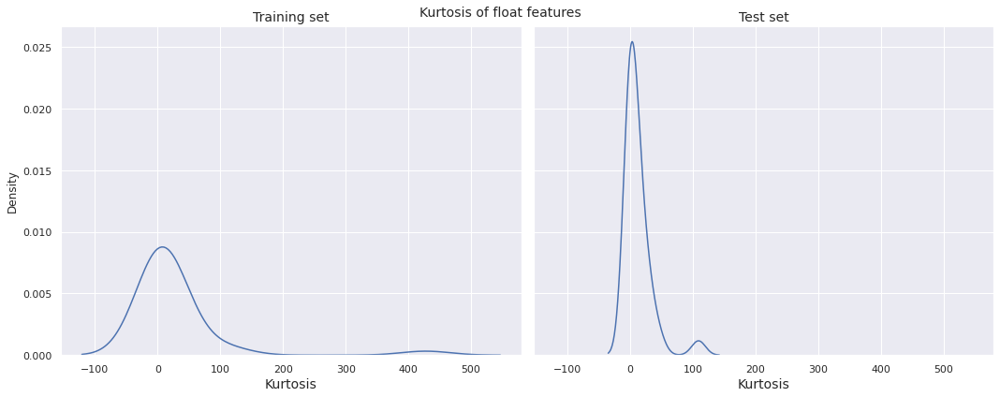

In [ ]:
fig, ax = plt.subplots(1, 2, figsize = (15, 6), sharex = True, sharey = True)
sns.kdeplot(data = higgs_kurt, x = 'Training set (all events)', ax = ax[0])
sns.kdeplot(data = higgs_kurt, x = 'Test set (all events)', ax = ax[1])
ax[0].set_title("Training set", fontsize = 14)
ax[0].set_xlabel("Kurtosis", fontsize = 14)
ax[1].set_title("Test set", fontsize = 14)
ax[1].set_xlabel("Kurtosis", fontsize = 14)
plt.suptitle("Kurtosis of float features", fontsize = 14)
plt.tight_layout()
plt.show()

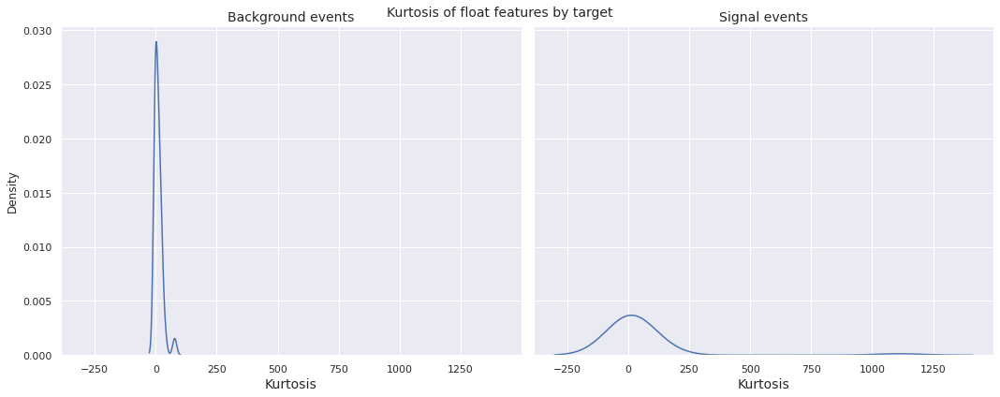

In [ ]:
fig, ax = plt.subplots(1, 2, figsize = (15, 6), sharex = True, sharey = True)
sns.kdeplot(data = higgs_kurt, x = 'Training set (background events)', ax = ax[0])
sns.kdeplot(data = higgs_kurt, x = 'Training set (signal events)', ax = ax[1])
ax[0].set_title("Background events", fontsize = 14)
ax[0].set_xlabel("Kurtosis", fontsize = 14)
ax[1].set_title("Signal events", fontsize = 14)
ax[1].set_xlabel("Kurtosis", fontsize = 14)
plt.suptitle("Kurtosis of float features by target", fontsize = 14)
plt.tight_layout()
plt.show()

In [ ]:
higgs_corr = pd.DataFrame(columns = ['feature_1', 'feature_2', 'Training set (background events)', 'Training set (signal events)', 'Training set (all events)', 'Test set (all events)'])
cols = cols_float_test
for i in range(len(cols)):
    for j in range(len(cols)):
        if i<j:
            higgs_corr.loc[len(higgs_corr.index)] = [cols[i], cols[j], train_b[cols[i]].corr(train_b[cols[j]]), train_s[cols[i]].corr(train_s[cols[j]]), train[cols[i]].corr(train[cols[j]]), test[cols[i]].corr(test[cols[j]])]
higgs_corr.sort_values(by = 'Training set (all events)', ascending = False, inplace = True)
higgs_corr # df_corr.style.set_caption("Correlation coefficient of pairs of float features")

,feature_1,feature_2,Training set (background events),Training set (signal events),Training set (all events),Test set (all events)
121,DER_deltaeta_jet_jet,DER_lep_eta_centrality,0.999999,0.999998,0.999998,0.999998
308,DER_lep_eta_centrality,PRI_jet_subleading_phi,0.999998,0.999997,0.999998,0.999998
307,DER_lep_eta_centrality,PRI_jet_subleading_eta,0.999998,0.999996,0.999997,0.999997
136,DER_deltaeta_jet_jet,PRI_jet_subleading_phi,0.999997,0.999994,0.999996,0.999996
135,DER_deltaeta_jet_jet,PRI_jet_subleading_eta,0.999997,0.999993,0.999995,0.999995
...,...,...,...,...,...,...
257,DER_pt_ratio_lep_tau,PRI_tau_pt,-0.427420,-0.496085,-0.473882,-0.474721
448,PRI_jet_leading_phi,Weight,-0.635793,-0.505453,-0.503384,-0.505651
442,PRI_jet_leading_eta,Weight,-0.635795,-0.505458,-0.503388,-0.505652
435,PRI_jet_leading_pt,Weight,-0.646751,-0.515051,-0.512539,-0.514652


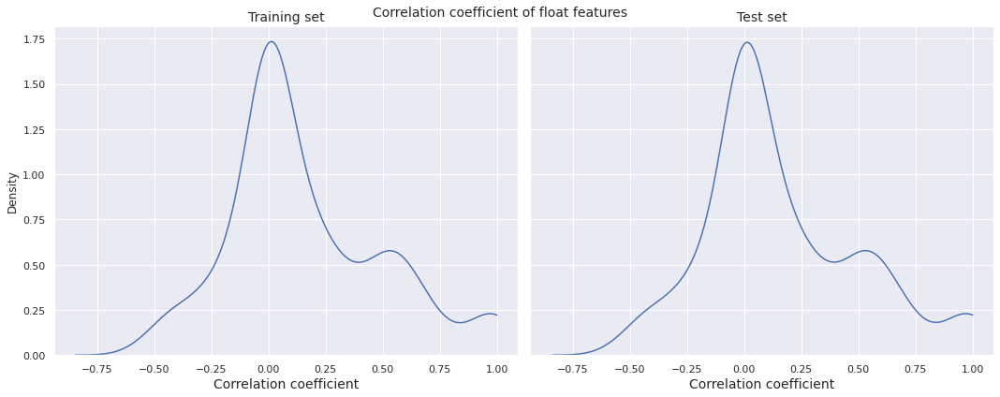

In [ ]:
fig, ax = plt.subplots(1, 2, figsize = (15, 6), sharex = True, sharey = True)
sns.kdeplot(data = higgs_corr, x = 'Training set (all events)', clip = (-1.0, 1.0), ax = ax[0])
sns.kdeplot(data = higgs_corr, x = 'Test set (all events)', clip = (-1.0, 1.0), ax = ax[1])
ax[0].set_title("Training set", fontsize = 14)
ax[0].set_xlabel("Correlation coefficient", fontsize = 14)
ax[1].set_title("Test set", fontsize = 14)
ax[1].set_xlabel("Correlation coefficient", fontsize = 14)
plt.suptitle("Correlation coefficient of float features", fontsize = 14)
plt.tight_layout()
plt.show()

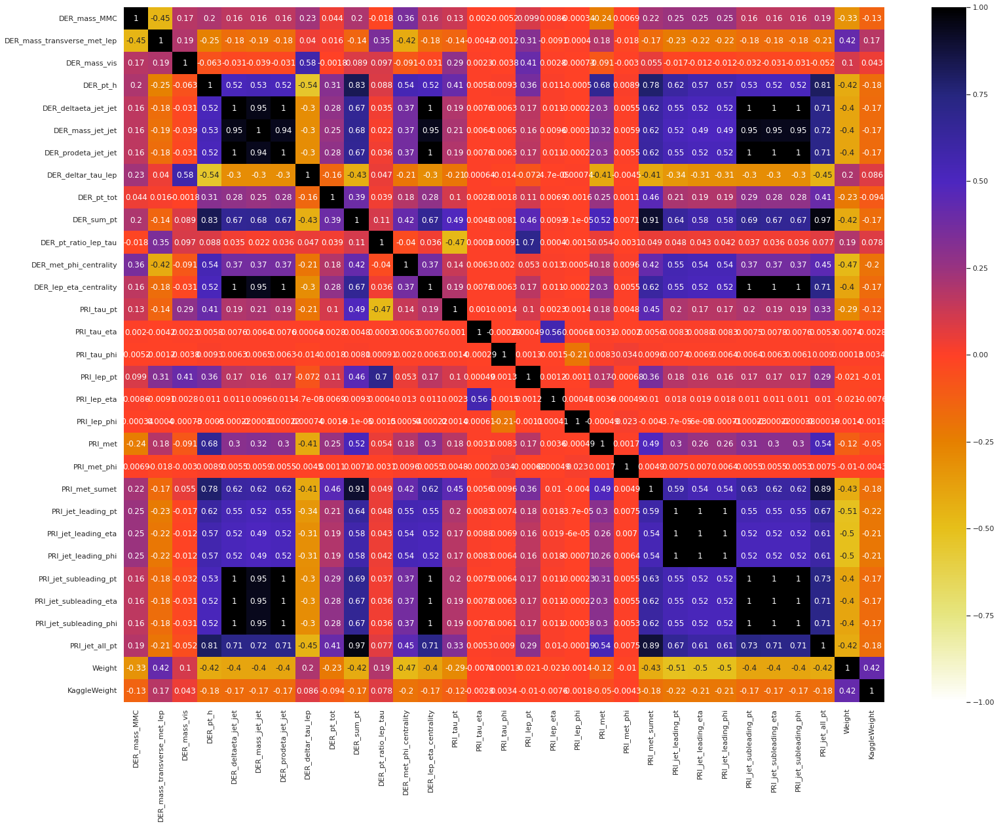

In [ ]:
plt.figure(figsize = (26, 19.5))
sns.heatmap(train[cols_float_test].corr(), vmin = -1, vmax = 1, annot = True, cmap = plt.cm.CMRmap_r)

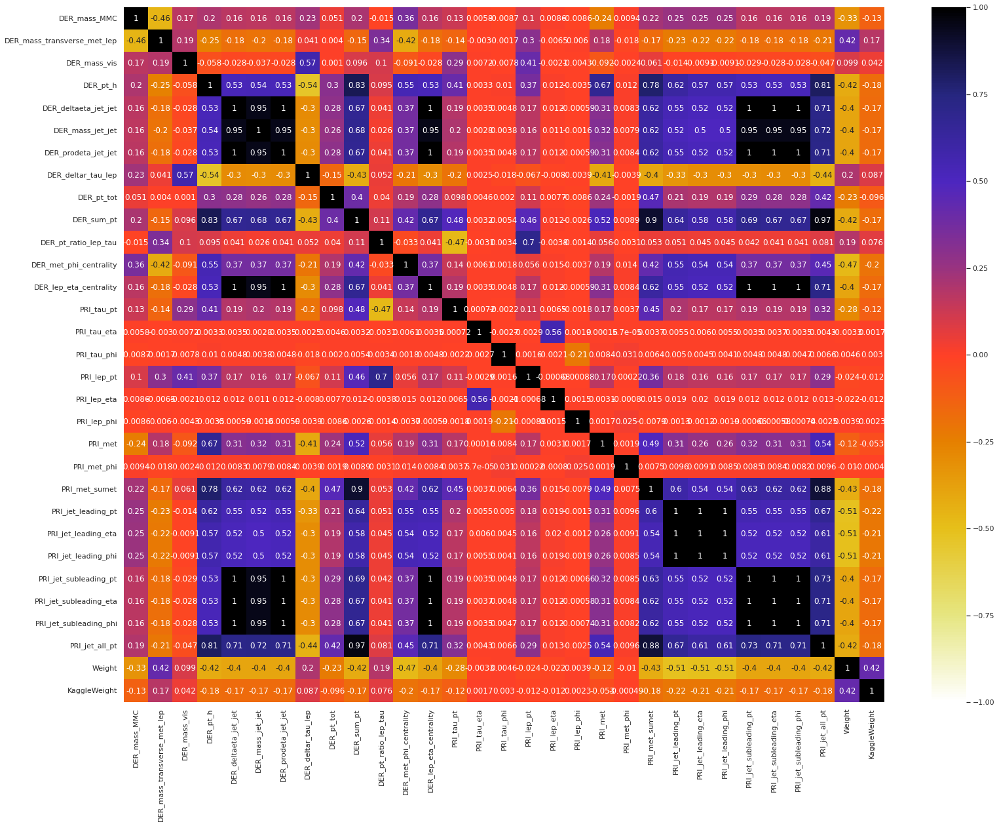

In [ ]:
plt.figure(figsize = (26, 19.5))
sns.heatmap(test[cols_float_test].corr(), vmin = -1, vmax = 1, annot = True, cmap = plt.cm.CMRmap_r)

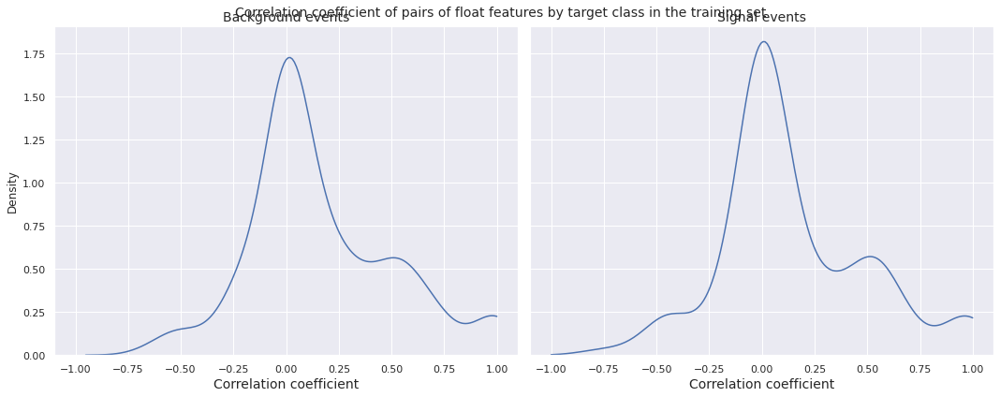

In [ ]:
fig, ax = plt.subplots(1, 2, figsize = (15, 6), sharex = True, sharey = True)
sns.kdeplot(data = higgs_corr, x = 'Training set (background events)', clip = (-1.0, 1.0), ax = ax[0])
sns.kdeplot(data = higgs_corr, x = 'Training set (signal events)', clip = (-1.0, 1.0), ax = ax[1])
ax[0].set_title("Background events", fontsize = 14)
ax[0].set_xlabel("Correlation coefficient", fontsize = 14)
ax[1].set_title("Signal events", fontsize = 14)
ax[1].set_xlabel("Correlation coefficient", fontsize = 14)
plt.suptitle("Correlation coefficient of pairs of float features by target class in the training set", fontsize = 14)
plt.tight_layout()
plt.show()

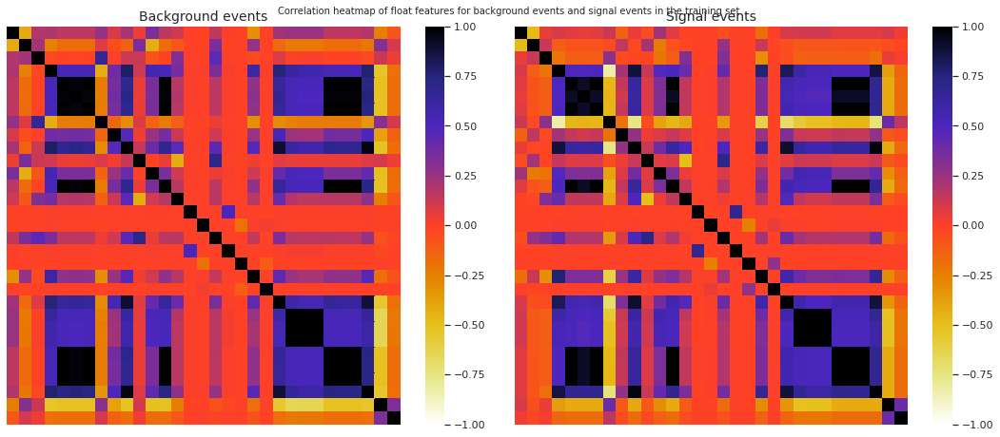

In [ ]:
fig, ax = plt.subplots(1, 2, figsize = (15, 6.5), sharex = True, sharey = True)
sns.heatmap(train_b[cols_float_test].corr(), vmin = -1, vmax = 1, annot = False, xticklabels = False, yticklabels = False, cmap = plt.cm.CMRmap_r, ax = ax[0])
sns.heatmap(train_s[cols_float_test].corr(), vmin = -1, vmax = 1, annot = False, xticklabels = False, yticklabels = False, cmap = plt.cm.CMRmap_r, ax = ax[1])
ax[0].set_title("Background events", fontsize = 14)
ax[1].set_title("Signal events", fontsize = 14)
plt.suptitle("Correlation heatmap of float features for background events and signal events in the training set", fontsize = 10)
plt.tight_layout()
plt.show()

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:30: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).



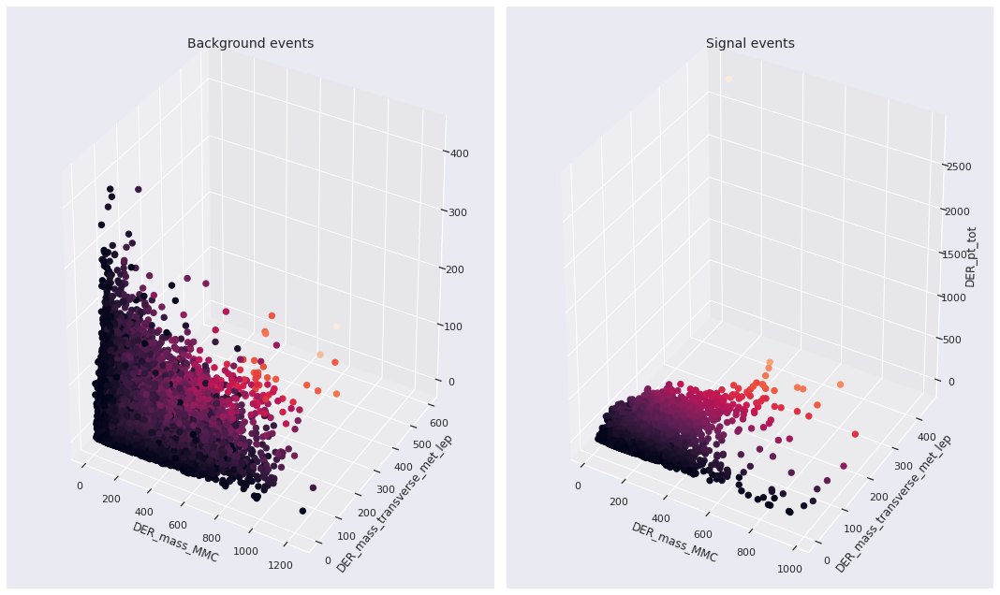

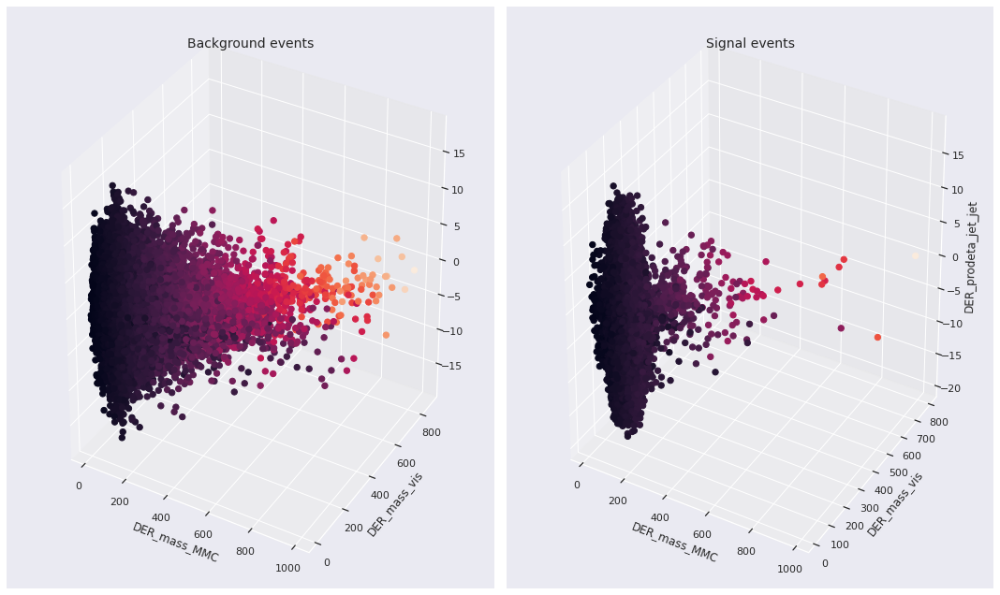

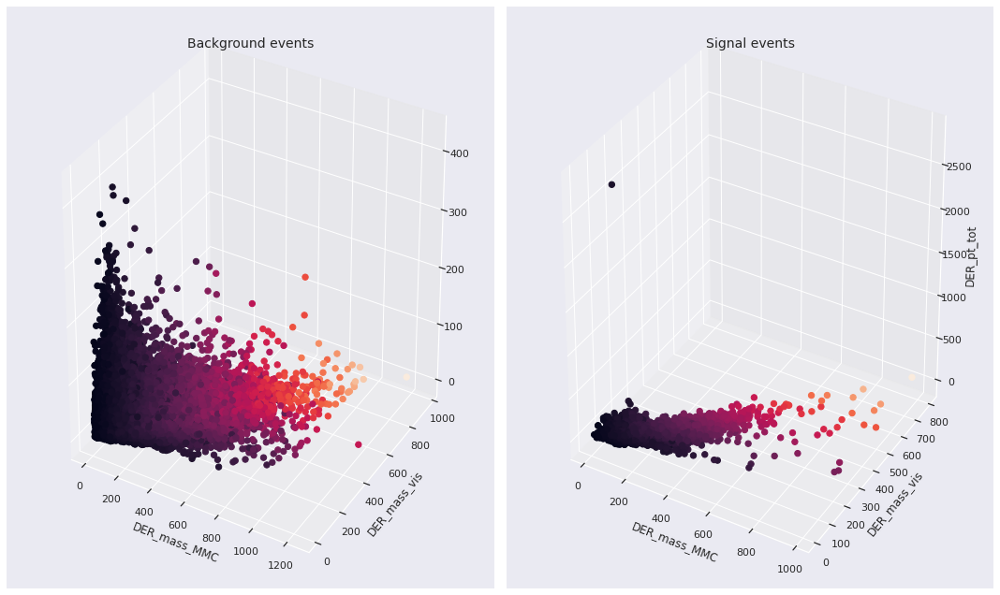

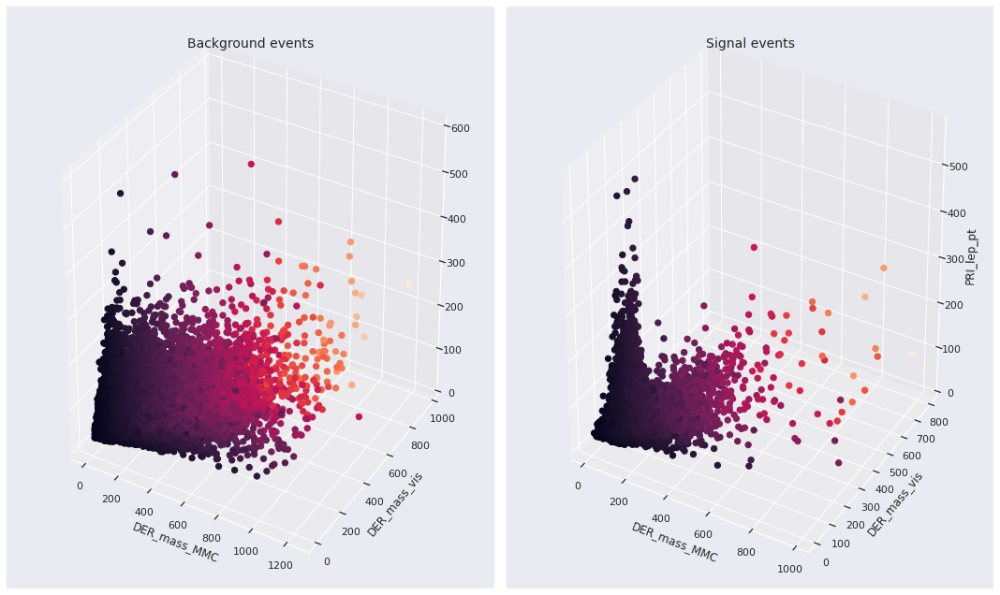

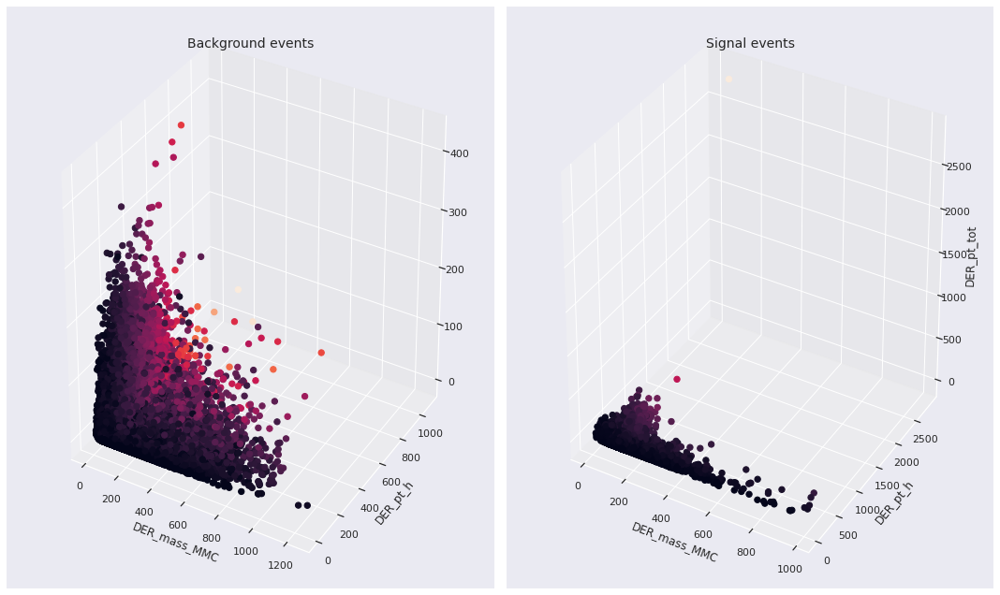

...

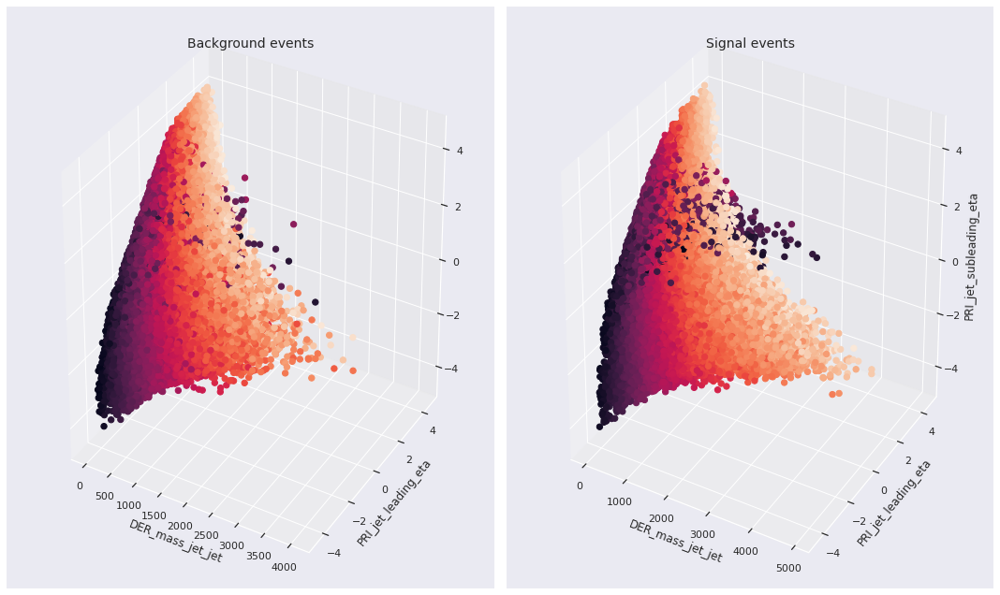

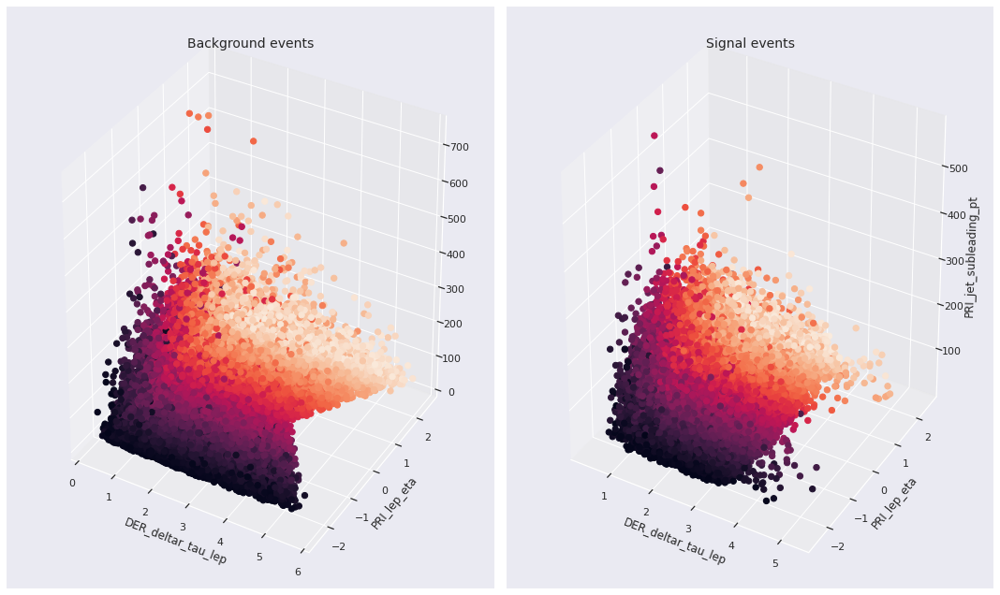

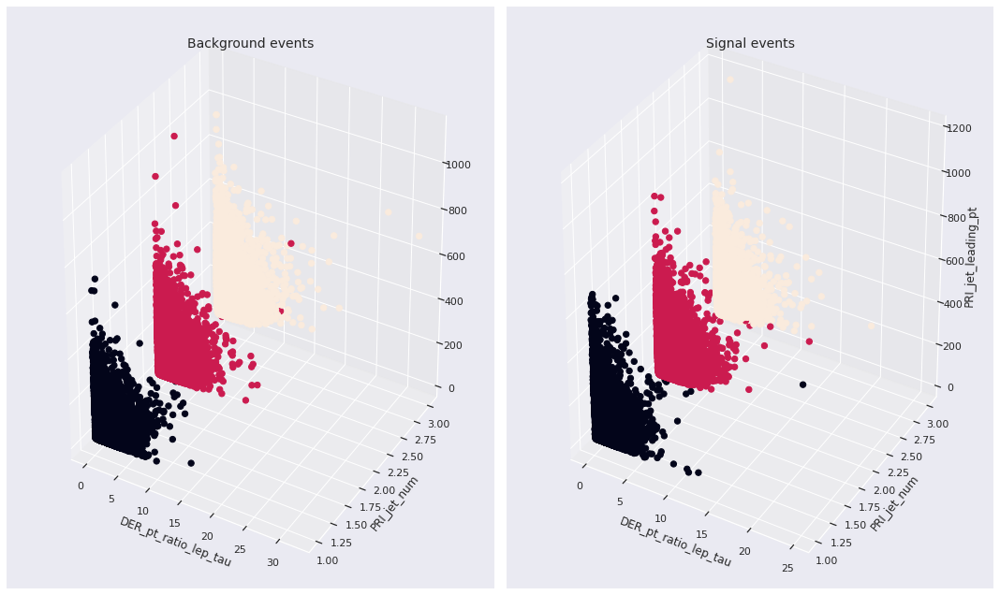

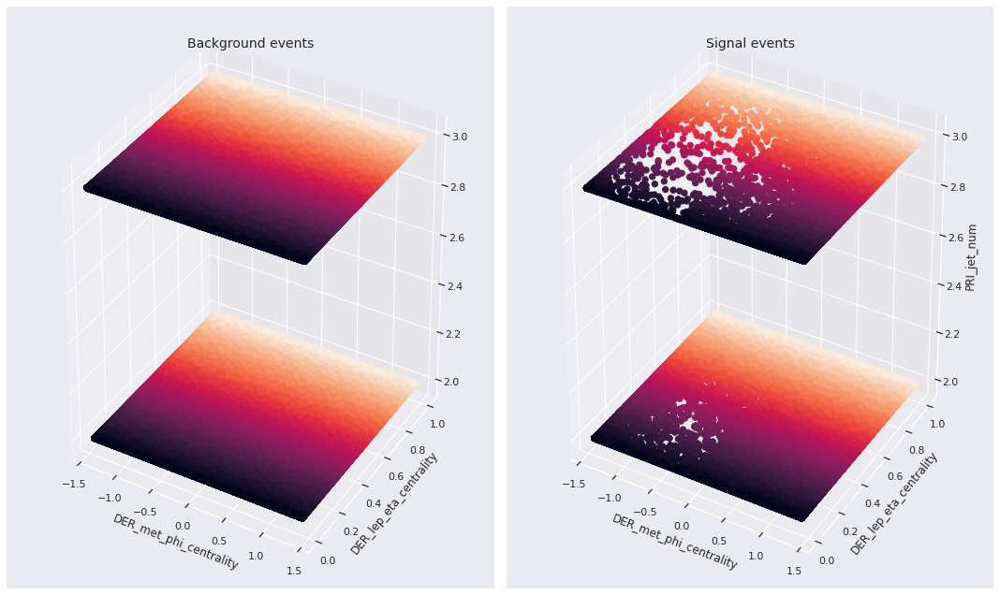

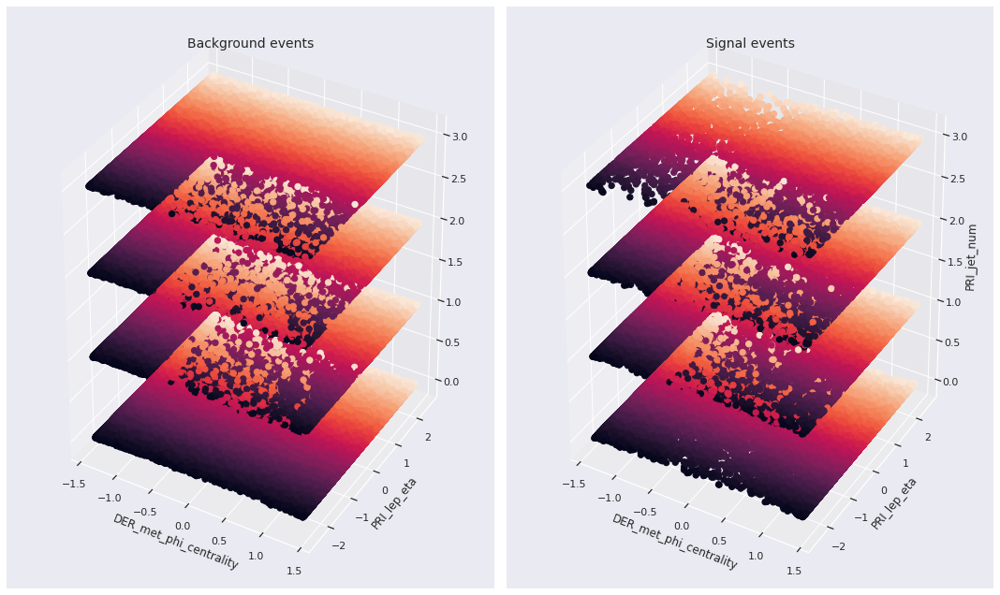

In [ ]:
triples_selected = [
    ('DER_mass_MMC', 'DER_mass_transverse_met_lep', 'DER_pt_tot'),
    ('DER_mass_MMC', 'DER_mass_vis', 'DER_prodeta_jet_jet'),
    ('DER_mass_MMC', 'DER_mass_vis', 'DER_pt_tot'),
    ('DER_mass_MMC', 'DER_mass_vis', 'PRI_lep_pt'),
    ('DER_mass_MMC', 'DER_pt_h', 'DER_pt_tot'),
    ('DER_mass_MMC', 'DER_pt_h', 'PRI_jet_subleading_pt'),
    ('DER_mass_MMC', 'DER_deltaeta_jet_jet', 'PRI_jet_num'),
    ('DER_mass_MMC', 'DER_mass_jet_jet', 'PRI_jet_subleading_eta'),
    ('DER_mass_MMC', 'DER_prodeta_jet_jet', 'DER_pt_tot'),
    ('DER_mass_MMC', 'DER_lep_eta_centrality', 'PRI_met'),
    ('DER_mass_MMC', 'DER_lep_eta_centrality', 'PRI_jet_num'),
    ('DER_mass_MMC', 'PRI_met_phi', 'PRI_jet_subleading_pt'),
    ('DER_mass_MMC', 'PRI_jet_num', 'PRI_jet_leading_pt'),
    ('DER_mass_vis', 'DER_pt_h', 'PRI_jet_leading_pt'),
    ('DER_pt_h', 'PRI_jet_num', 'PRI_jet_leading_eta'),
    ('DER_deltaeta_jet_jet', 'DER_prodeta_jet_jet', 'PRI_jet_subleading_eta'),('DER_deltaeta_jet_jet', 'DER_prodeta_jet_jet', 'PRI_jet_subleading_phi'),
    ('DER_deltaeta_jet_jet', 'DER_prodeta_jet_jet', 'PRI_jet_all_pt'),
    ('DER_deltaeta_jet_jet', 'DER_met_phi_centrality', 'PRI_jet_num'),
    ('DER_mass_jet_jet', 'DER_deltar_tau_lep', 'PRI_lep_pt'),
    ('DER_mass_jet_jet', 'PRI_tau_pt', 'PRI_jet_subleading_eta'),
    ('DER_prodeta_jet_jet', 'DER_sum_pt', 'PRI_jet_all_pt'),
    ('DER_mass_jet_jet', 'PRI_jet_leading_eta', 'PRI_jet_subleading_eta'),
    ('DER_deltar_tau_lep', 'PRI_lep_eta', 'PRI_jet_subleading_pt'),
    ('DER_pt_ratio_lep_tau', 'PRI_jet_num', 'PRI_jet_leading_pt'),
    ('DER_met_phi_centrality', 'DER_lep_eta_centrality', 'PRI_jet_num'),
    ('DER_met_phi_centrality', 'PRI_lep_eta', 'PRI_jet_num')
]
for z in triples_selected:
    fig = plt.figure(figsize = (15, 9))
    ax = fig.add_subplot(1, 2, 1, projection = '3d')
    x_b = train_b.replace(-999, np.nan)[z[0]]
    y_b = train_b.replace(-999, np.nan)[z[1]]
    z_b = train_b.replace(-999, np.nan)[z[2]]
    s1 = ax.scatter(x_b, y_b, z_b, s = 40, marker = 'o', c = y_b, alpha = 1)
    ax.set_title("Background events", fontsize = 14)
    ax.set_xlabel(z[0])
    ax.set_ylabel(z[1]) # ax.set_zlabel(z[2])
    ax = fig.add_subplot(1, 2, 2, projection = '3d')
    x_s = train_s.replace(-999, np.nan)[z[0]]
    y_s = train_s.replace(-999, np.nan)[z[1]]
    z_s = train_s.replace(-999, np.nan)[z[2]]
    s2 = ax.scatter(x_s, y_s, z_s, s = 40, marker = 'o', c = y_s, alpha = 1)
    ax.set_title("Signal events", fontsize = 14)
    ax.set_xlabel(z[0])
    ax.set_ylabel(z[1])
    ax.set_zlabel(z[2])
    plt.tight_layout()

plt.show()

In [ ]:
! pip install h2o

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 177.4 MB 42 kB/s 
  Created wheel for h2o: filename=h2o-3.38.0.2-py2.py3-none-any.whl size=177521195 sha256=deb8d05234742d7854940280416f75d369e9cce79108a205b7c426880c92de84
  Stored in directory: /root/.cache/pip/wheels/e4/ef/ab/a9b2e452e18b3dfea0b6114bc57c3b9e8b0e464eb2d03230e1
Successfully built h2o


In [ ]:
import h2o
h2o.init(max_mem_size = 2)           
h2o.remove_all()
%matplotlib inline
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from h2o.estimators.deeplearning import H2ODeepLearningEstimator

Checking whether there is an H2O instance running at http://localhost:54321 ..... not found.
Attempting to start a local H2O server...
  Java Version: openjdk version "11.0.16" 2022-07-19; OpenJDK Runtime Environment (build 11.0.16+8-post-Ubuntu-0ubuntu118.04); OpenJDK 64-Bit Server VM (build 11.0.16+8-post-Ubuntu-0ubuntu118.04, mixed mode, sharing)
  Starting server from /usr/local/lib/python3.7/dist-packages/h2o/backend/bin/h2o.jar
  Ice root: /tmp/tmp943gy9yo
  JVM stdout: /tmp/tmp943gy9yo/h2o_unknownUser_started_from_python.out
  JVM stderr: /tmp/tmp943gy9yo/h2o_unknownUser_started_from_python.err
  Server is running at http://127.0.0.1:54321
Connecting to H2O server at http://127.0.0.1:54321 ... successful.


H2O_cluster_uptime:,02 secs
H2O_cluster_timezone:,Etc/UTC
H2O_data_parsing_timezone:,UTC
H2O_cluster_version:,3.38.0.2
H2O_cluster_version_age:,9 days
H2O_cluster_name:,H2O_from_python_unknownUser_4opjbd
H2O_cluster_total_nodes:,1
H2O_cluster_free_memory:,2 Gb
H2O_cluster_total_cores:,2
H2O_cluster_allowed_cores:,2
H2O_cluster_status:,"locked, healthy"


In [ ]:
higgs = h2o.import_file('higgs.csv.gz')

Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%


In [ ]:
higgs.drop(['KaggleSet', 'KaggleWeight'], axis=1)

EventId,DER_mass_MMC,DER_mass_transverse_met_lep,DER_mass_vis,DER_pt_h,DER_deltaeta_jet_jet,DER_mass_jet_jet,DER_prodeta_jet_jet,DER_deltar_tau_lep,DER_pt_tot,DER_sum_pt,DER_pt_ratio_lep_tau,DER_met_phi_centrality,DER_lep_eta_centrality,PRI_tau_pt,PRI_tau_eta,PRI_tau_phi,PRI_lep_pt,PRI_lep_eta,PRI_lep_phi,PRI_met,PRI_met_phi,PRI_met_sumet,PRI_jet_num,PRI_jet_leading_pt,PRI_jet_leading_eta,PRI_jet_leading_phi,PRI_jet_subleading_pt,PRI_jet_subleading_eta,PRI_jet_subleading_phi,PRI_jet_all_pt,Weight,Label
100000,138.47,51.655,97.827,27.98,0.91,124.711,2.666,3.064,41.928,197.76,1.582,1.396,0.2,32.638,1.017,0.381,51.626,2.273,-2.414,16.824,-0.277,258.733,2,67.435,2.15,0.444,46.062,1.24,-2.475,113.497,0.00081448,s
100001,160.937,68.768,103.235,48.146,-999,-999,-999,3.473,2.078,125.157,0.879,1.414,-999,42.014,2.039,-3.011,36.918,0.501,0.103,44.704,-1.916,164.546,1,46.226,0.725,1.158,-999,-999,-999,46.226,0.681042,b
100002,-999,162.172,125.953,35.635,-999,-999,-999,3.148,9.336,197.814,3.776,1.414,-999,32.154,-0.705,-2.093,121.409,-0.953,1.052,54.283,-2.186,260.414,1,44.251,2.053,-2.028,-999,-999,-999,44.251,0.715742,b
100003,143.905,81.417,80.943,0.414,-999,-999,-999,3.31,0.414,75.968,2.354,-1.285,-999,22.647,-1.655,0.01,53.321,-0.522,-3.1,31.082,0.06,86.062,0,-999,-999,-999,-999,-999,-999,0,1.66065,b
100004,175.864,16.915,134.805,16.405,-999,-999,-999,3.891,16.405,57.983,1.056,-1.385,-999,28.209,-2.197,-2.231,29.774,0.798,1.569,2.723,-0.871,53.131,0,-999,-999,-999,-999,-999,-999,0,1.90426,b
100005,89.744,13.55,59.149,116.344,2.636,284.584,-0.54,1.362,61.619,278.876,0.588,0.479,0.975,53.651,0.371,1.329,31.565,-0.884,1.857,40.735,2.237,282.849,3,90.547,-2.412,-0.653,56.165,0.224,3.106,193.66,0.0254338,b
100006,148.754,28.862,107.782,106.13,0.733,158.359,0.113,2.941,2.545,305.967,3.371,1.393,0.791,28.85,1.113,2.409,97.24,0.675,-0.966,38.421,-1.443,294.074,2,123.01,0.864,1.45,56.867,0.131,-2.767,179.877,0.00081448,s
100007,154.916,10.418,94.714,29.169,-999,-999,-999,2.897,1.526,138.178,0.365,-1.305,-999,78.8,0.654,1.547,28.74,0.506,-1.347,22.275,-1.761,187.299,1,30.638,-0.715,-1.724,-999,-999,-999,30.638,0.00572068,s
100008,105.594,50.559,100.989,4.288,-999,-999,-999,2.904,4.288,65.333,0.675,-1.366,-999,39.008,2.433,-2.532,26.325,0.21,1.884,37.791,0.024,129.804,0,-999,-999,-999,-999,-999,-999,0,1.6148,b
100009,128.053,88.941,69.272,193.392,-999,-999,-999,1.609,28.859,255.123,0.599,0.538,-999,54.646,-1.533,0.416,32.742,-0.317,-0.636,132.678,0.845,294.741,1,167.735,-2.767,-2.514,-999,-999,-999,167.735,0.000461025,s


In [ ]:
higgs_df = higgs.as_data_frame(use_pandas=True)

In [ ]:
higgs_df['Label'].value_counts()

b    538678
s    279560
Name: Label, dtype: int64

In [ ]:
higgs1=higgs.drop(['KaggleSet', 'KaggleWeight'], axis=1)
higgs1.describe()

Rows:818238
Cols:33

,EventId,DER_mass_MMC,DER_mass_transverse_met_lep,DER_mass_vis,DER_pt_h,DER_deltaeta_jet_jet,DER_mass_jet_jet,DER_prodeta_jet_jet,DER_deltar_tau_lep,DER_pt_tot,DER_sum_pt,DER_pt_ratio_lep_tau,DER_met_phi_centrality,DER_lep_eta_centrality,PRI_tau_pt,PRI_tau_eta,PRI_tau_phi,PRI_lep_pt,PRI_lep_eta,PRI_lep_phi,PRI_met,PRI_met_phi,PRI_met_sumet,PRI_jet_num,PRI_jet_leading_pt,PRI_jet_leading_eta,PRI_jet_leading_phi,PRI_jet_subleading_pt,PRI_jet_subleading_eta,PRI_jet_subleading_phi,PRI_jet_all_pt,Weight,Label
type,int,real,real,real,real,real,real,real,real,real,real,real,real,real,real,real,real,real,real,real,real,real,real,int,real,real,real,real,real,real,real,real,enum
mins,100000.0,-999.0,0.0,6.329,0.0,-999.0,-999.0,-999.0,0.208,0.0,46.103,0.047,-1.414,-999.0,20.0,-2.499,-3.142,26.0,-2.508,-3.142,0.051,-3.142,13.678,0.0,-999.0,-999.0,-999.0,-999.0,-999.0,-999.0,0.0,0.000461025356734,
mean,509118.5,-48.819018731713555,49.252714088077305,81.14056096148049,57.84952417389545,-707.7408799713579,-600.1911911399866,-708.681306407184,2.373871382165085,18.969617243393756,158.59615892808674,1.4387755445237256,-0.127277217631056,-708.3069176119914,38.69815220632642,-0.011662892703589866,-0.013158134919180017,46.6924138062519,-0.019079470765229763,0.0494604088297048,41.65452646418282,-0.008634276335247253,209.9087302545229,0.9799227119737747,-348.7578397947798,-399.6932941332482,-399.7038575573371,-691.6261113233539,-708.4422064643796,-708.4433118872508,73.2055937832271,0.503144361334385,
maxs,918237.0,1949.261,968.669,1349.351,2834.999,8.724,4974.979,17.65,5.751,2834.999,2079.162,32.228,1.414,1.0,764.408,2.5,3.142,701.328,2.506,3.142,2842.617,3.142,2190.275,3.0,1163.439,4.5,3.142,817.801,4.5,3.142,1860.175,2.38631583084,
sigma,236205.1091181137,406.11839738380405,35.378608835957074,40.58270776635657,63.41193842824419,454.7938994985362,658.7240401916804,453.32859921032775,0.7808753293094252,21.918490754824987,116.0898094920282,0.8451093113398227,1.1942348304383956,453.9091274797473,22.429016375347217,1.2135113109297002,1.8160831510749702,22.14233687142169,1.2642503720169442,1.8150987187944545,32.49611304941336,1.8127031279122563,126.81668590410617,0.9787929270183173,533.0970063549731,489.42856044473183,489.42001299922265,480.27474424935525,453.6991500398255,453.69715797651935,98.33175414048536,0.5721997727051731,
zeros,0,0,9,0,124,38,0,187,0,122,0,0,171,51537,0,0,116,0,120,117,0,136,0,327371,0,92,79,0,49,36,327371,0,
missing,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
0,100000.0,138.47,51.655,97.827,27.98,0.91,124.711,2.666,3.064,41.928,197.76,1.582,1.396,0.2,32.638,1.017,0.381,51.626,2.273,-2.414,16.824,-0.277,258.733,2.0,67.435,2.15,0.444,46.062,1.24,-2.475,113.497,0.00081448039868,s
1,100001.0,160.937,68.768,103.235,48.146,-999.0,-999.0,-999.0,3.473,2.078,125.157,0.879,1.414,-999.0,42.014,2.039,-3.011,36.918,0.501,0.103,44.704,-1.916,164.546,1.0,46.226,0.725,1.158,-999.0,-999.0,-999.0,46.226,0.681041906806,b
2,100002.0,-999.0,162.172,125.953,35.635,-999.0,-999.0,-999.0,3.148,9.336,197.814,3.776,1.414,-999.0,32.154,-0.705,-2.093,121.409,-0.953,1.052,54.283,-2.186,260.414,1.0,44.251,2.053,-2.028,-999.0,-999.0,-999.0,44.251,0.715742006349,b


In [ ]:
train, valid, test = higgs1.split_frame([0.6, 0.2], seed = 2019)
higgs1_X = higgs1.col_names[1: -1]
higgs1_y = higgs1.col_names[-1]

In [ ]:
higgs1_model_v1 = H2ODeepLearningEstimator(model_id = 'higgs_v1', epochs = 10, variable_importances = True)
higgs1_model_v1.train(higgs1_X, higgs1_y, training_frame = train, validation_frame = valid)
print(higgs1_model_v1)

deeplearning Model Build progress: |█████████████████████████████████████████████| (done) 100%
Model Details
H2ODeepLearningEstimator : Deep Learning
Model Key: higgs_v1


Status of Neuron Layers: predicting Label, 2-class classification, bernoulli distribution, CrossEntropy loss, 47,002 weights/biases, 565.3 KB, 4,912,616 training samples, mini-batch size 1
    layer    units    type       dropout    l1    l2    mean_rate            rate_rms             momentum    mean_weight            weight_rms           mean_bias            bias_rms
--  -------  -------  ---------  ---------  ----  ----  -------------------  -------------------  ----------  ---------------------  -------------------  -------------------  ------------------
    1        31       Input      0.0
    2        200      Rectifier  0.0        0.0   0.0   0.06475904308227273  0.22636115550994873  0.0         -0.010778017295327322  0.17878729104995728  0.06175670100860793  0.4577643871307373
    3        200      Rectifie

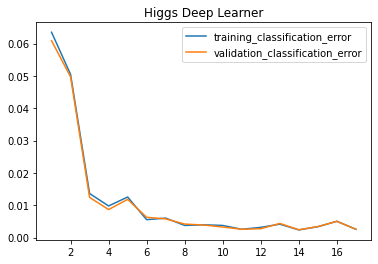

In [ ]:
higgs1_v1_df = higgs1_model_v1.score_history()
plt.plot(higgs1_v1_df['training_classification_error'], label="training_classification_error")
plt.plot(higgs1_v1_df['validation_classification_error'], label="validation_classification_error")
plt.title("Higgs Deep Learner")
plt.legend();

In [ ]:
pred = higgs1_model_v1.predict(test[1:-1]).as_data_frame(use_pandas=True)
test_actual = test.as_data_frame(use_pandas=True)['Label']
(test_actual == pred['predict']).mean()

deeplearning prediction progress: |██████████████████████████████████████████████| (done) 100%


0.9975456743275086

In [ ]:
higgs1_model_v2 = H2ODeepLearningEstimator(model_id = 'higgs_v2', hidden = [32, 32, 32], epochs = 1000000, score_validation_samples = 10000, stopping_rounds = 2, stopping_metric = 'misclassification', 
stopping_tolerance = 0.01)
higgs1_model_v2.train(higgs1_X, higgs1_y, training_frame = train, validation_frame = valid)

deeplearning Model Build progress: |█████████████████████████████████████████████| (done) 100%


Model Details
=============
H2ODeepLearningEstimator : Deep Learning
Model Key: higgs_v2


Status of Neuron Layers: predicting Label, 2-class classification, bernoulli distribution, CrossEntropy loss, 3,202 weights/biases, 49.0 KB, 2,014,252 training samples, mini-batch size 1
    layer    units    type       dropout    l1    l2    mean_rate              rate_rms              momentum    mean_weight             weight_rms           mean_bias            bias_rms
--  -------  -------  ---------  ---------  ----  ----  ---------------------  --------------------  ----------  ----------------------  -------------------  -------------------  -------------------
    1        31       Input      0.0
    2        32       Rectifier  0.0        0.0   0.0   0.0012653659282899489  0.001602452713996172  0.0         -0.0054665820832389776  0.24697428941726685  0.27571951904287806  0.45042264461517334
    3        32       Rectifier  0.0        0.0   0.0   0.08293880775639373    0.24946367740631104   0.0         -0.07374631699116208    0.2452784776687622   0.759611956833211    0.48108720779418945
    4        32       Rectifier  0.0        0.0   0.0   0.07478470305267138    0.22798305749893188   0.0         -0.05836438818901968    0.29301023483276367  0.5236704381737496   0.47684967517852783
    5        2        Softmax               0.0   0.0   0.017726777605275856   0.031896382570266724  0.0         0.06831200612941757     1.3173480033874512   0.8654885378208322   0.18459028005599976

ModelMetricsBinomial: deeplearning
** Reported on train data. **

MSE: 0.0023142087633553823
RMSE: 0.04810622374865213
LogLoss: 0.00825041917814782
Mean Per-Class Error: 0.002955177435493549
AUC: 0.9999578856708022
AUCPR: 0.9999238907779487
Gini: 0.9999157713416045

Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.6568888741457918
       b     s     Error    Rate
-----  ----  ----  -------  --------------
b      6467  11    0.0017   (11.0/6478.0)
s      15    3546  0.0042   (15.0/3561.0)
Total  6482  3557  0.0026   (26.0/10039.0)

Maximum Metrics: Maximum metrics at their respective thresholds
metric                       threshold    value     idx
---------------------------  -----------  --------  -----
max f1                       0.656889     0.996347  229
max f2                       0.27357      0.996522  255
max f0point5                 0.85341      0.997176  208
max accuracy                 0.656889     0.99741   229
max precision                0.999991     1         0
max recall                   0.016369     1         331
max specificity              0.999991     1         0
max absolute_mcc             0.656889     0.994341  229
max min_per_class_accuracy   0.458244     0.996911  242
max mean_per_class_accuracy  0.54595      0.997094  234
max tns                      0.999991     6478      0
max fns                      0.999991     3220      0
max fps                      1.41412e-07  6478      399
max tps                      0.016369     3561      331
max tnr                      0.999991     1         0
max fnr                      0.999991     0.90424   0
max fpr                      1.41412e-07  1         399
max tpr                      0.016369     1         331

Gains/Lift Table: Avg response rate: 35.47 %, avg score: 35.50 %
group    cumulative_data_fraction    lower_threshold    lift     cumulative_lift    response_rate    score         cumulative_response_rate    cumulative_score    capture_rate    cumulative_capture_rate    gain     cumulative_gain    kolmogorov_smirnov
-------  --------------------------  -----------------  -------  -----------------  ---------------  ------------  --------------------------  ------------------  --------------  -------------------------  -------  -----------------  --------------------
1        0.0100608                   0.999993           2.81915  2.81915            1                0.999995      1                           0.999995            0.0283628       0.0283628                  181.

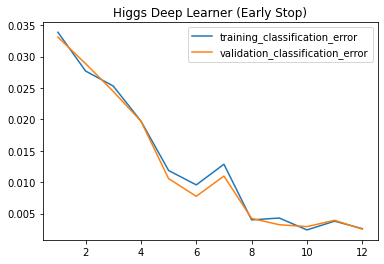

In [ ]:
higgs1_v2_df = higgs1_model_v2.score_history()
plt.plot(higgs1_v2_df['training_classification_error'], label="training_classification_error")
plt.plot(higgs1_v2_df['validation_classification_error'], label="validation_classification_error")
plt.title("Higgs Deep Learner (Early Stop)")
plt.legend();

In [ ]:
pred = higgs1_model_v2.predict(test[1:-1]).as_data_frame(use_pandas=True)
test_actual = test.as_data_frame(use_pandas=True)['Label']
(test_actual == pred['predict']).mean()

deeplearning prediction progress: |██████████████████████████████████████████████| (done) 100%


0.9971723230406708

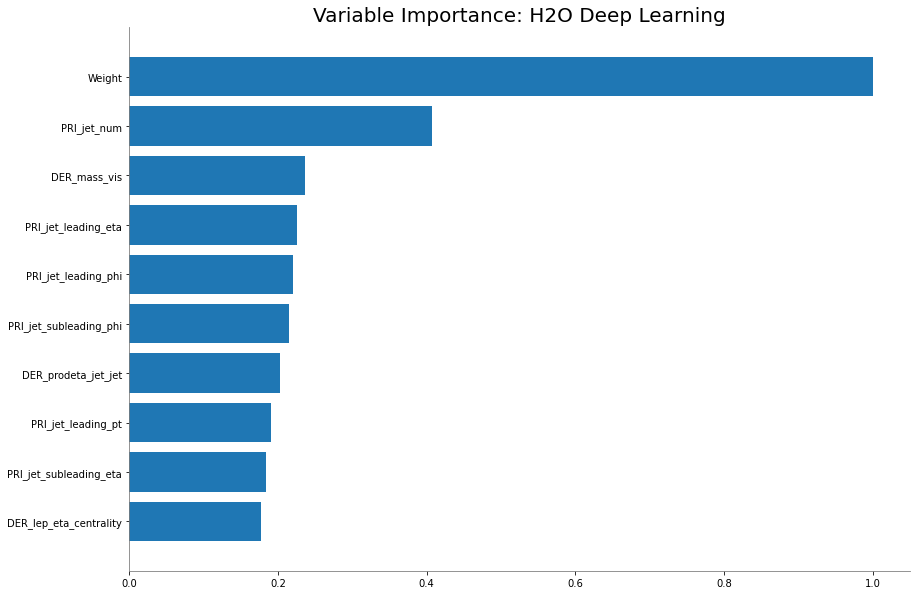

<Figure size 432x288 with 0 Axes>

In [ ]:
higgs1_model_v2.varimp_plot();